# 🎵 Open-Unmix Semplificato
Una versione leggera dell'architettura Open-Unmix per separazione spettrale, pensata per il training su CPU.

In [ ]:
%pip install torchaudio librosa matplotlib mir_eval

In [2]:
import torch
import torch.nn as nn
import librosa
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from torch.utils.data import DataLoader, Dataset
import os
import glob
import mir_eval

In [3]:
def wav_to_mag(wav, n_fft=1024, hop_length=512):
    stft = librosa.stft(wav, n_fft=n_fft, hop_length=hop_length)
    magnitude = np.abs(stft)
    return torch.tensor(magnitude.T, dtype=torch.float32)  # (time, freq)

In [6]:
class OpenUnmixMini(nn.Module):
    def __init__(self, n_bins, hidden_size=512):
        super(OpenUnmixMini, self).__init__()
        self.bn1 = nn.BatchNorm1d(n_bins)
        self.fc1 = nn.Linear(n_bins, hidden_size)
        self.tanh = nn.Tanh()

        self.blstm = nn.LSTM(
            input_size=hidden_size, hidden_size=hidden_size,
            num_layers=3, bidirectional=True, batch_first=True
        )

        self.fc2 = nn.Linear(2 * hidden_size, hidden_size)
        self.bn2 = nn.BatchNorm1d(hidden_size)
        self.relu = nn.ReLU()

        self.fc3 = nn.Linear(hidden_size, n_bins)
        self.bn3 = nn.BatchNorm1d(n_bins)
        self.output_activation = nn.ReLU()  # Masking non-negativa

    def forward(self, x):
        x_in = x.clone()
        x = self.bn1(x.transpose(1, 2)).transpose(1, 2)
        x = self.tanh(self.fc1(x))
        x, _ = self.blstm(x)
        x = self.relu(self.bn2(self.fc2(x).transpose(1, 2)).transpose(1, 2))
        x = self.output_activation(self.bn3(self.fc3(x).transpose(1, 2)).transpose(1, 2))
        return x * x_in  # maschera moltiplicativa

In [ ]:
class UNetOpenUnmix(nn.Module):
    def __init__(self, n_bins=513, hidden_size=256):
        super(UNetOpenUnmix, self).__init__()
        self.n_bins = n_bins
        
        # Encoder (downsampling path)
        self.enc1 = nn.Sequential(
            nn.Conv1d(n_bins, hidden_size, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU(),
            nn.Conv1d(hidden_size, hidden_size, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU()
        )
        
        self.enc2 = nn.Sequential(
            nn.MaxPool1d(2),
            nn.Conv1d(hidden_size, hidden_size * 2, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 2),
            nn.ReLU(),
            nn.Conv1d(hidden_size * 2, hidden_size * 2, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 2),
            nn.ReLU()
        )
        
        self.enc3 = nn.Sequential(
            nn.MaxPool1d(2),
            nn.Conv1d(hidden_size * 2, hidden_size * 4, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 4),
            nn.ReLU(),
            nn.Conv1d(hidden_size * 4, hidden_size * 4, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 4),
            nn.ReLU()
        )
        
        # Bottleneck with LSTM
        self.bottleneck_conv = nn.Conv1d(hidden_size * 4, hidden_size * 8, kernel_size=3, padding=1)
        self.bottleneck_bn = nn.BatchNorm1d(hidden_size * 8)
        self.bottleneck_relu = nn.ReLU()
        
        # LSTM for temporal modeling
        self.lstm = nn.LSTM(
            input_size=hidden_size * 8,
            hidden_size=hidden_size * 4,
            num_layers=2,
            bidirectional=True,
            batch_first=True
        )
        
        # Decoder (upsampling path)
        self.dec3 = nn.Sequential(
            nn.ConvTranspose1d(hidden_size * 8, hidden_size * 4, kernel_size=2, stride=2),
            nn.BatchNorm1d(hidden_size * 4),
            nn.ReLU()
        )
        self.dec3_conv = nn.Sequential(
            nn.Conv1d(hidden_size * 8, hidden_size * 4, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 4),
            nn.ReLU(),
            nn.Conv1d(hidden_size * 4, hidden_size * 4, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 4),
            nn.ReLU()
        )
        
        self.dec2 = nn.Sequential(
            nn.ConvTranspose1d(hidden_size * 4, hidden_size * 2, kernel_size=2, stride=2),
            nn.BatchNorm1d(hidden_size * 2),
            nn.ReLU()
        )
        self.dec2_conv = nn.Sequential(
            nn.Conv1d(hidden_size * 4, hidden_size * 2, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 2),
            nn.ReLU(),
            nn.Conv1d(hidden_size * 2, hidden_size * 2, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 2),
            nn.ReLU()
        )
        
        self.dec1 = nn.Sequential(
            nn.ConvTranspose1d(hidden_size * 2, hidden_size, kernel_size=2, stride=2),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU()
        )
        self.dec1_conv = nn.Sequential(
            nn.Conv1d(hidden_size * 2, hidden_size, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU(),
            nn.Conv1d(hidden_size, hidden_size, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU()
        )
        
        # Output layer
        self.output = nn.Sequential(
            nn.Conv1d(hidden_size, n_bins, kernel_size=1),
            nn.ReLU()  # Ensure non-negative output for masking
        )
        
    def forward(self, x):
        # x shape: (batch, time, freq) -> need (batch, freq, time) for conv1d
        x_input = x.clone()
        x = x.transpose(1, 2)  # (batch, freq, time)
        
        # Encoder
        enc1_out = self.enc1(x)  # (batch, hidden_size, time)
        enc2_out = self.enc2(enc1_out)  # (batch, hidden_size*2, time/2)
        enc3_out = self.enc3(enc2_out)  # (batch, hidden_size*4, time/4)
        
        # Bottleneck
        bottleneck = self.bottleneck_relu(self.bottleneck_bn(self.bottleneck_conv(enc3_out)))
        
        # LSTM processing
        # Reshape for LSTM: (batch, time, features)
        lstm_input = bottleneck.transpose(1, 2)  # (batch, time/4, hidden_size*8)
        lstm_out, _ = self.lstm(lstm_input)  # (batch, time/4, hidden_size*8)
        lstm_out = lstm_out.transpose(1, 2)  # (batch, hidden_size*8, time/4)
        
        # Decoder with skip connections
        dec3_up = self.dec3(lstm_out)  # Upsample
        # Handle size mismatch with interpolation if needed
        if dec3_up.size(2) != enc3_out.size(2):
            dec3_up = torch.nn.functional.interpolate(dec3_up, size=enc3_out.size(2), mode='linear', align_corners=False)
        dec3_concat = torch.cat([dec3_up, enc3_out], dim=1)  # Skip connection
        dec3_out = self.dec3_conv(dec3_concat)
        
        dec2_up = self.dec2(dec3_out)
        if dec2_up.size(2) != enc2_out.size(2):
            dec2_up = torch.nn.functional.interpolate(dec2_up, size=enc2_out.size(2), mode='linear', align_corners=False)
        dec2_concat = torch.cat([dec2_up, enc2_out], dim=1)
        dec2_out = self.dec2_conv(dec2_concat)
        
        dec1_up = self.dec1(dec2_out)
        if dec1_up.size(2) != enc1_out.size(2):
            dec1_up = torch.nn.functional.interpolate(dec1_up, size=enc1_out.size(2), mode='linear', align_corners=False)
        dec1_concat = torch.cat([dec1_up, enc1_out], dim=1)
        dec1_out = self.dec1_conv(dec1_concat)
        
        # Output
        mask = self.output(dec1_out)  # (batch, freq, time)
        mask = mask.transpose(1, 2)  # (batch, time, freq)
        
        # Apply mask to input
        return mask * x_input

In [62]:
class ResidualBlock(nn.Module):
    """Residual block with dilated convolutions"""
    def __init__(self, channels, dilation=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv1d(channels, channels, kernel_size=3, padding=dilation, dilation=dilation)
        self.bn1 = nn.BatchNorm1d(channels)
        self.conv2 = nn.Conv1d(channels, channels, kernel_size=3, padding=dilation, dilation=dilation)
        self.bn2 = nn.BatchNorm1d(channels)
        self.dropout = nn.Dropout(0.1)
        
    def forward(self, x):
        residual = x
        out = torch.relu(self.bn1(self.conv1(x)))
        out = self.dropout(out)
        out = self.bn2(self.conv2(out))
        out += residual
        return torch.relu(out)

class AttentionBlock(nn.Module):
    """Self-attention mechanism for frequency domain"""
    def __init__(self, channels):
        super(AttentionBlock, self).__init__()
        self.query = nn.Conv1d(channels, channels // 8, kernel_size=1)
        self.key = nn.Conv1d(channels, channels // 8, kernel_size=1)
        self.value = nn.Conv1d(channels, channels, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        
    def forward(self, x):
        batch_size, channels, time = x.size()
        
        # Generate query, key, value
        q = self.query(x).view(batch_size, -1, time).permute(0, 2, 1)  # (B, T, C//8)
        k = self.key(x).view(batch_size, -1, time)  # (B, C//8, T)
        v = self.value(x).view(batch_size, -1, time)  # (B, C, T)
        
        # Attention computation
        attention = torch.bmm(q, k)  # (B, T, T)
        attention = torch.softmax(attention, dim=-1)
        
        # Apply attention to values
        out = torch.bmm(v, attention.permute(0, 2, 1))  # (B, C, T)
        out = self.gamma * out + x
        
        return out

class AdvancedUNetOpenUnmix(nn.Module):
    def __init__(self, n_bins=513, hidden_size=256, num_sources=1):
        super(AdvancedUNetOpenUnmix, self).__init__()
        self.n_bins = n_bins
        self.num_sources = num_sources
        
        # Input projection with multiple kernel sizes (multi-scale)
        self.input_proj = nn.ModuleList([
            nn.Conv1d(n_bins, hidden_size // 4, kernel_size=k, padding=k//2)
            for k in [3, 5, 7, 9]
        ])
        self.input_fusion = nn.Conv1d(hidden_size, hidden_size, kernel_size=1)
        
        # Encoder with residual blocks and attention
        self.enc1 = nn.Sequential(
            nn.Conv1d(hidden_size, hidden_size, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU(),
            ResidualBlock(hidden_size, dilation=1),
            ResidualBlock(hidden_size, dilation=2),
            AttentionBlock(hidden_size)
        )
        
        self.enc2 = nn.Sequential(
            nn.Conv1d(hidden_size, hidden_size * 2, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm1d(hidden_size * 2),
            nn.ReLU(),
            ResidualBlock(hidden_size * 2, dilation=1),
            ResidualBlock(hidden_size * 2, dilation=2),
            ResidualBlock(hidden_size * 2, dilation=4),
            AttentionBlock(hidden_size * 2)
        )
        
        self.enc3 = nn.Sequential(
            nn.Conv1d(hidden_size * 2, hidden_size * 4, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm1d(hidden_size * 4),
            nn.ReLU(),
            ResidualBlock(hidden_size * 4, dilation=1),
            ResidualBlock(hidden_size * 4, dilation=2),
            ResidualBlock(hidden_size * 4, dilation=4),
            ResidualBlock(hidden_size * 4, dilation=8),
            AttentionBlock(hidden_size * 4)
        )
        
        self.enc4 = nn.Sequential(
            nn.Conv1d(hidden_size * 4, hidden_size * 8, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm1d(hidden_size * 8),
            nn.ReLU(),
            ResidualBlock(hidden_size * 8, dilation=1),
            ResidualBlock(hidden_size * 8, dilation=2),
            ResidualBlock(hidden_size * 8, dilation=4),
            AttentionBlock(hidden_size * 8)
        )
        
        # Advanced bottleneck with multiple LSTMs and attention
        self.bottleneck_conv = nn.Conv1d(hidden_size * 8, hidden_size * 16, kernel_size=3, padding=1)
        self.bottleneck_bn = nn.BatchNorm1d(hidden_size * 16)
        
        # Multiple LSTM layers with SAME output dimensions
        self.lstm1 = nn.LSTM(
            input_size=hidden_size * 16,
            hidden_size=hidden_size * 8,  # Same hidden size
            num_layers=3,
            bidirectional=True,
            dropout=0.2,
            batch_first=True
        )
        
        self.lstm2 = nn.LSTM(
            input_size=hidden_size * 16,
            hidden_size=hidden_size * 8,  # Changed from * 4 to * 8
            num_layers=2,
            bidirectional=True,
            dropout=0.1,
            batch_first=True
        )
        
        # Projection layers to ensure consistent dimensions
        self.lstm1_proj = nn.Linear(hidden_size * 16, hidden_size * 16)  # bidirectional * 8 = 16
        self.lstm2_proj = nn.Linear(hidden_size * 16, hidden_size * 16)
        
        # Temporal attention for LSTM outputs
        self.temporal_attention = nn.MultiheadAttention(
            embed_dim=hidden_size * 16,
            num_heads=8,
            dropout=0.1,
            batch_first=True
        )
        
        # Decoder with more sophisticated upsampling
        self.dec4 = nn.Sequential(
            nn.ConvTranspose1d(hidden_size * 16, hidden_size * 8, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm1d(hidden_size * 8),
            nn.ReLU()
        )
        self.dec4_conv = nn.Sequential(
            nn.Conv1d(hidden_size * 16, hidden_size * 8, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 8),
            nn.ReLU(),
            ResidualBlock(hidden_size * 8, dilation=1),
            ResidualBlock(hidden_size * 8, dilation=2),
            AttentionBlock(hidden_size * 8)
        )
        
        self.dec3 = nn.Sequential(
            nn.ConvTranspose1d(hidden_size * 8, hidden_size * 4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm1d(hidden_size * 4),
            nn.ReLU()
        )
        self.dec3_conv = nn.Sequential(
            nn.Conv1d(hidden_size * 8, hidden_size * 4, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 4),
            nn.ReLU(),
            ResidualBlock(hidden_size * 4, dilation=1),
            ResidualBlock(hidden_size * 4, dilation=2),
            AttentionBlock(hidden_size * 4)
        )
        
        self.dec2 = nn.Sequential(
            nn.ConvTranspose1d(hidden_size * 4, hidden_size * 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm1d(hidden_size * 2),
            nn.ReLU()
        )
        self.dec2_conv = nn.Sequential(
            nn.Conv1d(hidden_size * 4, hidden_size * 2, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size * 2),
            nn.ReLU(),
            ResidualBlock(hidden_size * 2, dilation=1),
            ResidualBlock(hidden_size * 2, dilation=2),
            AttentionBlock(hidden_size * 2)
        )
        
        self.dec1 = nn.Sequential(
            nn.ConvTranspose1d(hidden_size * 2, hidden_size, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU()
        )
        self.dec1_conv = nn.Sequential(
            nn.Conv1d(hidden_size * 2, hidden_size, kernel_size=3, padding=1),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU(),
            ResidualBlock(hidden_size, dilation=1),
            AttentionBlock(hidden_size)
        )
        
        # Multi-source output heads
        self.output_heads = nn.ModuleList([
            nn.Sequential(
                nn.Conv1d(hidden_size, hidden_size // 2, kernel_size=3, padding=1),
                nn.BatchNorm1d(hidden_size // 2),
                nn.ReLU(),
                nn.Conv1d(hidden_size // 2, n_bins, kernel_size=1),
                nn.Sigmoid()  # Use sigmoid for better mask learning
            )
            for _ in range(num_sources)
        ])
        
    def forward(self, x):
        # x shape: (batch, time, freq) -> need (batch, freq, time) for conv1d
        x_input = x.clone()
        x = x.transpose(1, 2)  # (batch, freq, time)
        
        # Multi-scale input processing
        multi_scale_features = []
        for proj in self.input_proj:
            multi_scale_features.append(proj(x))
        
        x = torch.cat(multi_scale_features, dim=1)  # Concatenate multi-scale features
        x = self.input_fusion(x)
        
        # Encoder with skip connections
        enc1_out = self.enc1(x)
        enc2_out = self.enc2(enc1_out)
        enc3_out = self.enc3(enc2_out)
        enc4_out = self.enc4(enc3_out)
        
        # Advanced bottleneck processing
        bottleneck = torch.relu(self.bottleneck_bn(self.bottleneck_conv(enc4_out)))
        
        # LSTM processing with multiple configurations
        lstm_input = bottleneck.transpose(1, 2)  # (batch, time, features)
        
        lstm1_out, _ = self.lstm1(lstm_input)  # (batch, time, hidden_size * 16)
        lstm2_out, _ = self.lstm2(lstm_input)  # (batch, time, hidden_size * 16)
        
        # Apply projection layers to ensure consistent dimensions
        lstm1_out = self.lstm1_proj(lstm1_out)
        lstm2_out = self.lstm2_proj(lstm2_out)
        
        # Combine LSTM outputs (now same dimensions)
        combined_lstm = lstm1_out + lstm2_out  # Residual connection
        
        # Temporal attention
        attended_lstm, _ = self.temporal_attention(combined_lstm, combined_lstm, combined_lstm)
        attended_lstm = attended_lstm + combined_lstm  # Residual connection
        
        bottleneck_out = attended_lstm.transpose(1, 2)  # Back to (batch, features, time)
        
        # Decoder with skip connections and proper size handling
        dec4_up = self.dec4(bottleneck_out)
        if dec4_up.size(2) != enc4_out.size(2):
            dec4_up = torch.nn.functional.interpolate(dec4_up, size=enc4_out.size(2), mode='linear', align_corners=False)
        dec4_concat = torch.cat([dec4_up, enc4_out], dim=1)
        dec4_out = self.dec4_conv(dec4_concat)
        
        dec3_up = self.dec3(dec4_out)
        if dec3_up.size(2) != enc3_out.size(2):
            dec3_up = torch.nn.functional.interpolate(dec3_up, size=enc3_out.size(2), mode='linear', align_corners=False)
        dec3_concat = torch.cat([dec3_up, enc3_out], dim=1)
        dec3_out = self.dec3_conv(dec3_concat)
        
        dec2_up = self.dec2(dec3_out)
        if dec2_up.size(2) != enc2_out.size(2):
            dec2_up = torch.nn.functional.interpolate(dec2_up, size=enc2_out.size(2), mode='linear', align_corners=False)
        dec2_concat = torch.cat([dec2_up, enc2_out], dim=1)
        dec2_out = self.dec2_conv(dec2_concat)
        
        dec1_up = self.dec1(dec2_out)
        if dec1_up.size(2) != enc1_out.size(2):
            dec1_up = torch.nn.functional.interpolate(dec1_up, size=enc1_out.size(2), mode='linear', align_corners=False)
        dec1_concat = torch.cat([dec1_up, enc1_out], dim=1)
        dec1_out = self.dec1_conv(dec1_concat)
        
        # Multi-source output generation
        source_masks = []
        for head in self.output_heads:
            mask = head(dec1_out)  # (batch, freq, time)
            mask = mask.transpose(1, 2)  # (batch, time, freq)
            source_masks.append(mask)
        
        # For single source, return the first mask applied to input
        if self.num_sources == 1:
            return source_masks[0] * x_input
        else:
            # For multiple sources, return all separated sources
            separated_sources = []
            for mask in source_masks:
                separated_sources.append(mask * x_input)
            return separated_sources


In [83]:
class AudioSeparationLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1 = nn.L1Loss()
        self.mse = nn.MSELoss()
        
    def forward(self, pred, target):
        # Combine L1 and L2 losses
        l1_loss = self.l1(pred, target)
        l2_loss = self.mse(pred, target)
        
        # Energy preservation term
        pred_energy = torch.sum(pred**2, dim=(1, 2), keepdim=True)
        target_energy = torch.sum(target**2, dim=(1, 2), keepdim=True)
        energy_loss = self.mse(pred_energy, target_energy)
        
        # Spectral centroid preservation (frequency balance)
        freq_weights = torch.arange(pred.size(-1), device=pred.device).float()
        pred_centroid = torch.sum(pred * freq_weights, dim=-1) / (torch.sum(pred, dim=-1) + 1e-8)
        target_centroid = torch.sum(target * freq_weights, dim=-1) / (torch.sum(target, dim=-1) + 1e-8)
        centroid_loss = self.mse(pred_centroid, target_centroid)
        
        return 0.1 * l1_loss + 0.8 * l2_loss + 1e-12 * energy_loss + (0.2-1e-12) * centroid_loss

In [8]:
class MUSDB18Dataset(Dataset):
    def __init__(self, root_dir, split='train', sr=16000, n_fft=1024, hop_length=512, target='vocals', segment_length=60.0):
        self.root_dir = root_dir
        self.split = split
        self.sr = sr
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.target = target
        self.segment_length = segment_length  # Duration in seconds
        self.segment_samples = int(segment_length * sr)  # Convert to samples
        
        # Get all song folders
        self.song_dirs = [d for d in glob.glob(os.path.join(root_dir, split, '*')) if os.path.isdir(d)]
        
        # Filter out songs that don't have all required stems
        valid_songs = []
        for song_dir in self.song_dirs:
            stems = ['mixture.wav', 'drums.wav', 'bass.wav', 'vocals.wav', 'other.wav']
            if all(os.path.exists(os.path.join(song_dir, stem)) for stem in stems):
                valid_songs.append(song_dir)
        
        self.song_dirs = valid_songs
        print(f"Found {len(self.song_dirs)} valid songs in {split} set")

    def __len__(self):
        return len(self.song_dirs)

    def __getitem__(self, idx):
        song_dir = self.song_dirs[idx]
        
        # Load mixture and target stem
        mixture_path = os.path.join(song_dir, 'mixture.wav')
        target_path = os.path.join(song_dir, f'{self.target}.wav')
        
        # Load audio files with fixed duration
        mixture, _ = librosa.load(mixture_path, sr=self.sr, mono=True, duration=self.segment_length)
        target, _ = librosa.load(target_path, sr=self.sr, mono=True, duration=self.segment_length)
        
        # Ensure exact length (pad if necessary)
        if len(mixture) < self.segment_samples:
            mixture = np.pad(mixture, (0, self.segment_samples - len(mixture)), mode='constant', constant_values=0)
        if len(target) < self.segment_samples:
            target = np.pad(target, (0, self.segment_samples - len(target)), mode='constant', constant_values=0)
            
        # Truncate if longer (shouldn't happen with duration parameter, but just in case)
        mixture = mixture[:self.segment_samples]
        target = target[:self.segment_samples]
        
        # Convert to magnitude spectrograms
        mixture_mag = wav_to_mag(mixture, n_fft=self.n_fft, hop_length=self.hop_length)
        target_mag = wav_to_mag(target, n_fft=self.n_fft, hop_length=self.hop_length)
        
        return mixture_mag, target_mag


In [65]:
def train_and_validate_model(model, device, train_loader, test_loader):
    """ Train and validate the OpenUnmix model with early stopping and model saving. """
    # Move model to appropriate device
    model.to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    criterion = AudioSeparationLoss()

    # Training loop with early stopping and model saving
    epochs = 100
    best_val_loss = float('inf')
    patience = 10
    patience_counter = 0

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        num_batches = 0
    
        for mixture_mag, target_mag in train_loader:
            mixture_mag = mixture_mag.to(device)
            target_mag = target_mag.to(device)
        
            optimizer.zero_grad()
            output = model(mixture_mag)
            loss = criterion(output, target_mag)
            loss.backward()
            optimizer.step()
        
            train_loss += loss.item()
            num_batches += 1
        
        # Print progress every 10 batches
            if num_batches % 10 == 0:
                print(f"Epoch {epoch+1}/{epochs}, Batch {num_batches}, Loss: {loss.item():.4f}")
    
        avg_train_loss = train_loss / num_batches
    
    # Validation
        model.eval()
        val_loss = 0
        val_batches = 0
        with torch.no_grad():
            for mixture_mag, target_mag in test_loader:
                mixture_mag = mixture_mag.to(device)
                target_mag = target_mag.to(device)
                output = model(mixture_mag)
                loss = criterion(output, target_mag)
                val_loss += loss.item()
                val_batches += 1
    
        avg_val_loss = val_loss / val_batches if val_batches > 0 else 0
        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
    
    # Early stopping and model saving
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
        # Save the best model
            torch.save(model.state_dict(), 'best_model.pth')
            print(f"New best model saved with validation loss: {best_val_loss:.4f}")
        else:
            patience_counter += 1
            print(f"No improvement for {patience_counter} epochs")
        
            if patience_counter >= patience:
                print(f"Early stopping triggered after {patience} epochs without improvement")
                break

    print("Training completed!")
    print(f"Best validation loss: {best_val_loss:.4f}")

In [54]:
def calculate_metrics_simple(pred, target):
    """Simple and correct metrics calculation"""
    # Convert to numpy
    pred_np = pred
    target_np = target
    
    # Take mean of stereo channels for simplicity
    if len(pred_np.shape) > 1:
        pred_np = pred_np.mean(axis=0)
    if len(target_np.shape) > 1:
        target_np = target_np.mean(axis=0)
    
    # Ensure same length
    min_len = min(len(pred_np), len(target_np))
    pred_np = pred_np[:min_len]
    target_np = target_np[:min_len]
    
    eps = 1e-8
    
    # SDR calculation
    dot_product = np.dot(pred_np, target_np)
    target_energy = np.dot(target_np, target_np) + eps
    
    alpha = dot_product / target_energy
    scaled_target = alpha * target_np
    error = pred_np - scaled_target
    
    signal_power = np.dot(scaled_target, scaled_target) + eps
    error_power = np.dot(error, error) + eps
    
    sdr = 10 * np.log10(signal_power / error_power)
    
    return float(sdr)


# Function to calculate SDR using mir_eval
def calculate_sdr(estimated, target):
    """Calculate SDR using mir_eval"""
    # Ensure all arrays have the same length
    min_len = min(len(estimated), len(target))
    estimated = estimated[:min_len]
    target = target[:min_len]

    # check energy of estimated and target and avoid calculating SDR if both are insufficient
    if np.sum(estimated**2) < 1e-6 or np.sum(target**2) < 1e-6:
        print("Insufficient energy in estimated or target signal, returning NaN for SDR.")
        return float('nan')
    
    # Normalize estimated and target signals
    estimated = estimated / np.linalg.norm(estimated)
    target = target / np.linalg.norm(target)

    # Calculate SDR using mir_eval
    sdr, sir, sar, perm = mir_eval.separation.bss_eval_sources(
        target.reshape(1, -1), 
        estimated.reshape(1, -1),
        compute_permutation=False
    )
    
    return sdr[0]  # Return SDR for first source

# Inference on one test song
def perform_inference_on_test_song(calculate_sdr, model, device, test_dataset):
    """ Perform inference on a specific test song and display results. """
    print("=== INFERENCE ON TEST SONG ===")
    model.eval()
    with torch.no_grad():
        # Get a specific song from test set (you can change the index)
        song_index = 40  # Change this to access different songs (0 to len(test_dataset)-1)
    
        # Get the specific song directly from the dataset
        mixture_mag, target_mag = test_dataset[song_index]
    
        # Add batch dimension
        mixture_mag = mixture_mag.unsqueeze(0)
        target_mag = target_mag.unsqueeze(0)
        mixture_mag = mixture_mag.to(device)
        target_mag = target_mag.to(device)
    
        # Get model prediction for first song in batch
        predicted_mag = model(mixture_mag)
    
        # Take first song from batch
        mixture_spec = mixture_mag[0].cpu().numpy().T  # (freq, time)
        target_spec = target_mag[0].cpu().numpy().T
        predicted_spec = predicted_mag[0].cpu().numpy().T
    
        # Reconstruct audio using griffin-lim
        mixture_audio = librosa.griffinlim(mixture_spec, hop_length=512, n_iter=200, random_state=42)
        target_audio = librosa.griffinlim(target_spec, hop_length=512, n_iter=200, random_state=42)
        predicted_audio = librosa.griffinlim(predicted_spec, hop_length=512, n_iter=200, random_state=42)
    
        # Display spectrograms
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
        axes[0].imshow(librosa.amplitude_to_db(mixture_spec), aspect='auto', origin='lower')
        axes[0].set_title('Mixture Spectrogram')
        axes[0].set_xlabel('Time')
        axes[0].set_ylabel('Frequency')
    
        axes[1].imshow(librosa.amplitude_to_db(target_spec), aspect='auto', origin='lower')
        axes[1].set_title('Target Vocals Spectrogram')
        axes[1].set_xlabel('Time')
        axes[1].set_ylabel('Frequency')
    
        axes[2].imshow(librosa.amplitude_to_db(predicted_spec), aspect='auto', origin='lower')
        axes[2].set_title('Predicted Vocals Spectrogram')
        axes[2].set_xlabel('Time')
        axes[2].set_ylabel('Frequency')
    
        plt.tight_layout()
        plt.show()
    
        # Play audio samples
        print("\nAudio Samples:")
        print("Original Mixture:")
        ipd.display(ipd.Audio(mixture_audio, rate=16000))
    
        print("Target Vocals:")
        ipd.display(ipd.Audio(target_audio, rate=16000))
    
        print("Predicted Vocals:")
        ipd.display(ipd.Audio(predicted_audio, rate=16000))
    
        # Calculate SDR for this sample
        sample_sdr = calculate_sdr(predicted_audio, target_audio)
        print(f"SDR for this sample: {sample_sdr:.2f} dB")


In [55]:
def calculate_mean_sdr(model, device, test_loader):
    """Calculate mean SDR for all test songs."""
    print("\n=== CALCULATING MEAN SDR FOR ALL TEST SONGS ===")
    sdr_scores = []
    model.eval()

    with torch.no_grad():
        for i, (mixture_mag, target_mag) in enumerate(test_loader):
            mixture_mag = mixture_mag.to(device)
            target_mag = target_mag.to(device)
        
        # Get model prediction
            predicted_mag = model(mixture_mag)
        
        # Process each song in the batch
            batch_size = mixture_mag.shape[0]
            for j in range(batch_size):
            # Convert to numpy and transpose for librosa
                target_spec = target_mag[j].cpu().numpy().T
                predicted_spec = predicted_mag[j].cpu().numpy().T
            
            # Reconstruct audio
                target_audio = librosa.griffinlim(target_spec, hop_length=512, n_iter=200, random_state=42)
                predicted_audio = librosa.griffinlim(predicted_spec, hop_length=512, n_iter=200, random_state=42)
            
            # Calculate SDR
                # if i == 0:
                #     # display audio predicted and target for the first song in the batch
                #     print(f"\n=== Processing song {i * batch_size + j + 1} ===")
                #     print("Original Mixture:")
                #     ipd.display(ipd.Audio(mixture_audio, rate=16000))
                #     print("Target Vocals:")
                #     ipd.display(ipd.Audio(target_audio, rate=16000))
                #     print("Predicted Vocals:")
                #     ipd.display(ipd.Audio(predicted_audio, rate=16000))
                try:
                    sdr = calculate_sdr(predicted_audio, target_audio)
                    sdr_scores.append(sdr)
                    print(f"Song {len(sdr_scores)}: SDR = {sdr:.2f} dB")
                except Exception as e:
                    print(f"Error calculating SDR for song {len(sdr_scores)+1}: {e}")

# Calculate statistics
    if sdr_scores:
        mean_sdr = np.mean(sdr_scores)
        std_sdr = np.std(sdr_scores)
        median_sdr = np.median(sdr_scores)
    
        print(f"\n=== SDR RESULTS ===")
        print(f"Mean SDR: {mean_sdr:.2f} ± {std_sdr:.2f} dB")
        print(f"Median SDR: {median_sdr:.2f} dB")
        print(f"Min SDR: {min(sdr_scores):.2f} dB")
        print(f"Max SDR: {max(sdr_scores):.2f} dB")
        print(f"Number of songs evaluated: {len(sdr_scores)}")
    
    # Plot SDR distribution
        plt.figure(figsize=(10, 6))
        plt.hist(sdr_scores, bins=20, alpha=0.7, edgecolor='black')
        plt.axvline(mean_sdr, color='red', linestyle='--', label=f'Mean: {mean_sdr:.2f} dB')
        plt.axvline(median_sdr, color='green', linestyle='--', label=f'Median: {median_sdr:.2f} dB')
        plt.xlabel('SDR (dB)')
        plt.ylabel('Number of Songs')
        plt.title('Distribution of SDR Scores')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.show()
    else:
        print("No SDR scores calculated successfully")


In [12]:
# Create datasets
train_dataset = MUSDB18Dataset('./musdb18hq', split='train', target='vocals')
test_dataset = MUSDB18Dataset('./musdb18hq', split='test', target='vocals')

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=0)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = torch.device('mps' if torch.backends.mps.is_available() else device)  # For Apple Silicon

Found 100 valid songs in train set
Found 50 valid songs in test set


### Open Unmix

In [ ]:
# Create new model for proper training
model_OpenUnmixMini = OpenUnmixMini(n_bins=513)  # 513 bins for n_fft=1024

In [ ]:
train_and_validate_model(model_OpenUnmixMini, device, train_loader, test_loader)

In [20]:
# load the best model for evaluation
model_OpenUnmixMini.load_state_dict(torch.load('best_model.pth'))

RuntimeError: Error(s) in loading state_dict for OpenUnmixMini:
	Missing key(s) in state_dict: "bn1.weight", "bn1.bias", "bn1.running_mean", "bn1.running_var", "fc1.weight", "fc1.bias", "blstm.weight_ih_l0", "blstm.weight_hh_l0", "blstm.bias_ih_l0", "blstm.bias_hh_l0", "blstm.weight_ih_l0_reverse", "blstm.weight_hh_l0_reverse", "blstm.bias_ih_l0_reverse", "blstm.bias_hh_l0_reverse", "blstm.weight_ih_l1", "blstm.weight_hh_l1", "blstm.bias_ih_l1", "blstm.bias_hh_l1", "blstm.weight_ih_l1_reverse", "blstm.weight_hh_l1_reverse", "blstm.bias_ih_l1_reverse", "blstm.bias_hh_l1_reverse", "blstm.weight_ih_l2", "blstm.weight_hh_l2", "blstm.bias_ih_l2", "blstm.bias_hh_l2", "blstm.weight_ih_l2_reverse", "blstm.weight_hh_l2_reverse", "blstm.bias_ih_l2_reverse", "blstm.bias_hh_l2_reverse", "fc2.weight", "fc2.bias", "bn2.weight", "bn2.bias", "bn2.running_mean", "bn2.running_var", "fc3.weight", "fc3.bias", "bn3.weight", "bn3.bias", "bn3.running_mean", "bn3.running_var". 
	Unexpected key(s) in state_dict: "enc1.0.weight", "enc1.0.bias", "enc1.1.weight", "enc1.1.bias", "enc1.1.running_mean", "enc1.1.running_var", "enc1.1.num_batches_tracked", "enc1.3.weight", "enc1.3.bias", "enc1.4.weight", "enc1.4.bias", "enc1.4.running_mean", "enc1.4.running_var", "enc1.4.num_batches_tracked", "enc2.1.weight", "enc2.1.bias", "enc2.2.weight", "enc2.2.bias", "enc2.2.running_mean", "enc2.2.running_var", "enc2.2.num_batches_tracked", "enc2.4.weight", "enc2.4.bias", "enc2.5.weight", "enc2.5.bias", "enc2.5.running_mean", "enc2.5.running_var", "enc2.5.num_batches_tracked", "enc3.1.weight", "enc3.1.bias", "enc3.2.weight", "enc3.2.bias", "enc3.2.running_mean", "enc3.2.running_var", "enc3.2.num_batches_tracked", "enc3.4.weight", "enc3.4.bias", "enc3.5.weight", "enc3.5.bias", "enc3.5.running_mean", "enc3.5.running_var", "enc3.5.num_batches_tracked", "bottleneck_conv.weight", "bottleneck_conv.bias", "bottleneck_bn.weight", "bottleneck_bn.bias", "bottleneck_bn.running_mean", "bottleneck_bn.running_var", "bottleneck_bn.num_batches_tracked", "lstm.weight_ih_l0", "lstm.weight_hh_l0", "lstm.bias_ih_l0", "lstm.bias_hh_l0", "lstm.weight_ih_l0_reverse", "lstm.weight_hh_l0_reverse", "lstm.bias_ih_l0_reverse", "lstm.bias_hh_l0_reverse", "lstm.weight_ih_l1", "lstm.weight_hh_l1", "lstm.bias_ih_l1", "lstm.bias_hh_l1", "lstm.weight_ih_l1_reverse", "lstm.weight_hh_l1_reverse", "lstm.bias_ih_l1_reverse", "lstm.bias_hh_l1_reverse", "dec3.0.weight", "dec3.0.bias", "dec3.1.weight", "dec3.1.bias", "dec3.1.running_mean", "dec3.1.running_var", "dec3.1.num_batches_tracked", "dec3_conv.0.weight", "dec3_conv.0.bias", "dec3_conv.1.weight", "dec3_conv.1.bias", "dec3_conv.1.running_mean", "dec3_conv.1.running_var", "dec3_conv.1.num_batches_tracked", "dec3_conv.3.weight", "dec3_conv.3.bias", "dec3_conv.4.weight", "dec3_conv.4.bias", "dec3_conv.4.running_mean", "dec3_conv.4.running_var", "dec3_conv.4.num_batches_tracked", "dec2.0.weight", "dec2.0.bias", "dec2.1.weight", "dec2.1.bias", "dec2.1.running_mean", "dec2.1.running_var", "dec2.1.num_batches_tracked", "dec2_conv.0.weight", "dec2_conv.0.bias", "dec2_conv.1.weight", "dec2_conv.1.bias", "dec2_conv.1.running_mean", "dec2_conv.1.running_var", "dec2_conv.1.num_batches_tracked", "dec2_conv.3.weight", "dec2_conv.3.bias", "dec2_conv.4.weight", "dec2_conv.4.bias", "dec2_conv.4.running_mean", "dec2_conv.4.running_var", "dec2_conv.4.num_batches_tracked", "dec1.0.weight", "dec1.0.bias", "dec1.1.weight", "dec1.1.bias", "dec1.1.running_mean", "dec1.1.running_var", "dec1.1.num_batches_tracked", "dec1_conv.0.weight", "dec1_conv.0.bias", "dec1_conv.1.weight", "dec1_conv.1.bias", "dec1_conv.1.running_mean", "dec1_conv.1.running_var", "dec1_conv.1.num_batches_tracked", "dec1_conv.3.weight", "dec1_conv.3.bias", "dec1_conv.4.weight", "dec1_conv.4.bias", "dec1_conv.4.running_mean", "dec1_conv.4.running_var", "dec1_conv.4.num_batches_tracked", "output.0.weight", "output.0.bias". 

In [ ]:
perform_inference_on_test_song(calculate_sdr, model_OpenUnmixMini, device, test_dataset)

In [ ]:
calculate_mean_sdr(model_OpenUnmixMini, device, test_loader)

### U-Net

In [81]:
model_UNetOpenUnmix = UNetOpenUnmix(n_bins=513)  # 513 bins for n_fft=1024

In [82]:
train_and_validate_model(model_UNetOpenUnmix, device, train_loader, test_loader)

Epoch 1/100, Batch 10, Loss: 346909343744.0000
Epoch 1/100, Batch 20, Loss: 293286150144.0000
Epoch 1/100, Batch 30, Loss: 208256876544.0000
Epoch 1/100, Batch 40, Loss: 12398417920.0000
Epoch 1/100, Batch 50, Loss: 44582416384.0000
Epoch 1/100 - Train Loss: 946319513397.7600, Val Loss: 2090131785256.9600
New best model saved with validation loss: 2090131785256.9600
Epoch 2/100, Batch 10, Loss: 213398454272.0000
Epoch 2/100, Batch 20, Loss: 223754567680.0000
Epoch 2/100, Batch 30, Loss: 236068143104.0000
Epoch 2/100, Batch 40, Loss: 54855262208.0000
Epoch 2/100, Batch 50, Loss: 65755590656.0000
Epoch 2/100 - Train Loss: 398585842851.8400, Val Loss: 331485557716.4800
New best model saved with validation loss: 331485557716.4800
Epoch 3/100, Batch 10, Loss: 47440441344.0000
Epoch 3/100, Batch 20, Loss: 33490176000.0000
Epoch 3/100, Batch 30, Loss: 269420511232.0000
Epoch 3/100, Batch 40, Loss: 718332362752.0000
Epoch 3/100, Batch 50, Loss: 16286868480.0000
Epoch 3/100 - Train Loss: 232387

KeyboardInterrupt: 

In [22]:
model_UNetOpenUnmix.load_state_dict(torch.load('best_model.pth'))

<All keys matched successfully>

=== INFERENCE ON TEST SONG ===


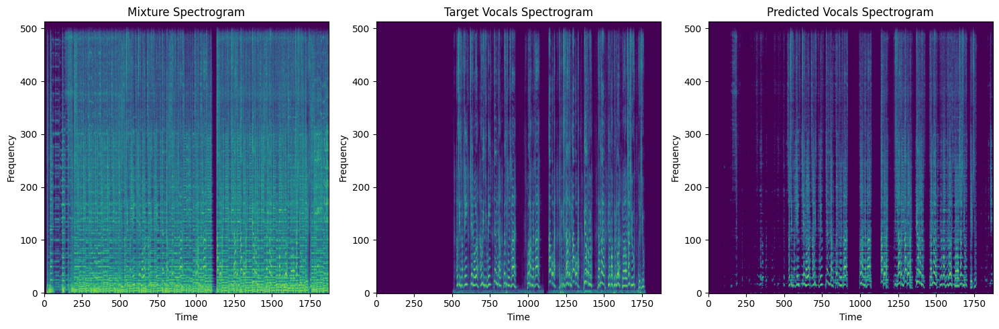


Audio Samples:
Original Mixture:


Target Vocals:


Predicted Vocals:


/var/folders/b3/9p1vx9h57c39zzmtx2ds2ffw0000gn/T/ipykernel_53853/3689547099.py:54: FutureWarning: mir_eval.separation.bss_eval_sources
	Deprecated as of mir_eval version 0.8.
	It will be removed in mir_eval version 0.9.
  sdr, sir, sar, perm = mir_eval.separation.bss_eval_sources(


SDR for this sample: -5.03 dB


In [56]:
perform_inference_on_test_song(calculate_sdr, model_UNetOpenUnmix, device, test_dataset)


=== CALCULATING MEAN SDR FOR ALL TEST SONGS ===


/var/folders/b3/9p1vx9h57c39zzmtx2ds2ffw0000gn/T/ipykernel_53853/3689547099.py:54: FutureWarning: mir_eval.separation.bss_eval_sources
	Deprecated as of mir_eval version 0.8.
	It will be removed in mir_eval version 0.9.
  sdr, sir, sar, perm = mir_eval.separation.bss_eval_sources(


Song 1: SDR = -6.30 dB
Song 2: SDR = -3.64 dB
Song 3: SDR = -6.65 dB
Song 4: SDR = -6.47 dB
Song 5: SDR = -2.52 dB
Song 6: SDR = -7.75 dB
Song 7: SDR = -1.43 dB
Song 8: SDR = -4.49 dB
Song 9: SDR = -8.59 dB
Song 10: SDR = -12.12 dB
Song 11: SDR = -7.45 dB
Song 12: SDR = -6.53 dB
Song 13: SDR = -4.33 dB
Song 14: SDR = -8.10 dB
Song 15: SDR = -4.82 dB
Song 16: SDR = -12.83 dB
Song 17: SDR = -6.89 dB
Song 18: SDR = -6.82 dB
Song 19: SDR = -13.03 dB
Song 20: SDR = -6.23 dB
Song 21: SDR = -7.86 dB
Song 22: SDR = -0.13 dB
Song 23: SDR = -17.54 dB
Song 24: SDR = -8.68 dB
Song 25: SDR = -9.61 dB
Song 26: SDR = -5.70 dB
Song 27: SDR = -3.55 dB
Song 28: SDR = -6.34 dB
Song 29: SDR = -3.27 dB
Song 30: SDR = -2.95 dB
Song 31: SDR = -6.99 dB
Song 32: SDR = -8.55 dB
Song 33: SDR = -5.12 dB
Song 34: SDR = -12.77 dB
Song 35: SDR = -3.22 dB
Song 36: SDR = -13.44 dB
Song 37: SDR = -4.19 dB
Song 38: SDR = -39.85 dB
Song 39: SDR = -6.76 dB
Song 40: SDR = -6.49 dB
Song 41: SDR = -5.03 dB
Song 42: SDR = -6.

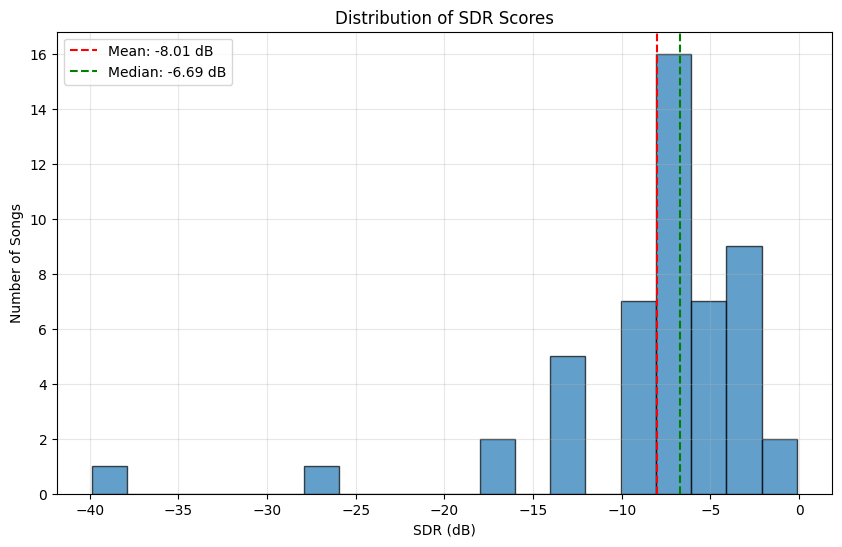

In [57]:
calculate_mean_sdr(model_UNetOpenUnmix, device, test_loader)

In [90]:
model_AdvancedUNet = AdvancedUNetOpenUnmix(n_bins=513, hidden_size=256, num_sources=1)

In [89]:
import gc

# Libera tutta la memoria della GPU
if torch.backends.mps.is_available():
    torch.mps.empty_cache()
elif torch.cuda.is_available():
    torch.cuda.empty_cache()

# Forza garbage collection
gc.collect()

print("Memoria GPU liberata!")

Memoria GPU liberata!


In [91]:
train_and_validate_model(model_AdvancedUNet, device, train_loader, test_loader)

Epoch 1/100, Batch 10, Loss: 533.4489
Epoch 1/100, Batch 20, Loss: 299.4761
Epoch 1/100, Batch 30, Loss: 1271.5156
Epoch 1/100, Batch 40, Loss: 640.2983
Epoch 1/100, Batch 50, Loss: 1930.3037
Epoch 1/100 - Train Loss: 1252.8205, Val Loss: 1427.1340
New best model saved with validation loss: 1427.1340
Epoch 2/100, Batch 10, Loss: 1876.4021
Epoch 2/100, Batch 20, Loss: 2414.5874
Epoch 2/100, Batch 30, Loss: 241.6147
Epoch 2/100, Batch 40, Loss: 1292.1066
Epoch 2/100, Batch 50, Loss: 475.4770
Epoch 2/100 - Train Loss: 1231.3820, Val Loss: 1532.4743
No improvement for 1 epochs
Epoch 3/100, Batch 10, Loss: 2102.5579
Epoch 3/100, Batch 20, Loss: 1130.0488
Epoch 3/100, Batch 30, Loss: 396.3053
Epoch 3/100, Batch 40, Loss: 890.6476
Epoch 3/100, Batch 50, Loss: 1113.8546
Epoch 3/100 - Train Loss: 1194.6303, Val Loss: 1375.9478
New best model saved with validation loss: 1375.9478
Epoch 4/100, Batch 10, Loss: 291.4066
Epoch 4/100, Batch 20, Loss: 754.6649
Epoch 4/100, Batch 30, Loss: 321.9327
Epo

KeyboardInterrupt: 

In [92]:
model_AdvancedUNet.load_state_dict(torch.load('best_model.pth'))

<All keys matched successfully>

=== INFERENCE ON TEST SONG ===


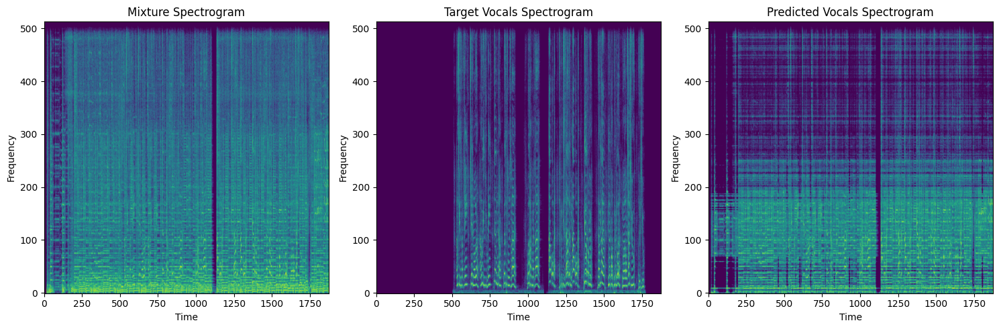


Audio Samples:
Original Mixture:


Target Vocals:


Predicted Vocals:


/var/folders/b3/9p1vx9h57c39zzmtx2ds2ffw0000gn/T/ipykernel_53853/3689547099.py:54: FutureWarning: mir_eval.separation.bss_eval_sources
	Deprecated as of mir_eval version 0.8.
	It will be removed in mir_eval version 0.9.
  sdr, sir, sar, perm = mir_eval.separation.bss_eval_sources(


SDR for this sample: -12.75 dB


In [93]:
perform_inference_on_test_song(calculate_sdr, model_AdvancedUNet, device, test_dataset)